# Differentiable 2D Rendering in JAX

In [261]:
import jax
import jax.numpy as np
import os
os.environ["CHALK_JAX"] = "1"
from chalk import *
from colour import Color
from IPython.display import display, HTML, SVG, Video, display, Image
import jax
import optax
import chalk.transform
import numpy as onp
import glob
import matplotlib.pyplot as plt

chalk.transform.set_jax_mode(False)
eps = 1e-3

HTML("""
<script src="https://unpkg.com/freezeframe/dist/freezeframe.min.js"></script>

  <style>
  .ff-container.ff-responsive: width: 60%;
  </style>

""")

In [223]:
import imageio.v2 as imageio
import base64
ff_id = 0

def animate_out(images, steps=36, rate=20, **kwargs):
    global ff_id
    with imageio.get_writer("/tmp/out.gif", loop=0, fps=rate, **kwargs) as writer:
        for im in images:
            image = imageio.imread(im)
            writer.append_data(image)
    base = base64.b64encode(open("/tmp/out.gif", 'br').read()).decode('ascii')
    ff_id += 1
    return HTML(f"""
  <img src="data:image/gif;base64,{base}" id='ff{ff_id}'>
<script>
new Freezeframe({{
  selector: '#ff{ff_id}'  
}});
</script>
  """)

grid = rectangle(4, 4).fill_color("white").line_width(0) + (make_path([(-2, 0), (2,0)]) +  make_path([(0, -2), (0,2)])).line_color("grey").line_width(1)
hgrid = rectangle(10, 10).fill_color("white").line_width(0).align_tl()

def animate(fn, steps=36, rate=20, grid=grid, **kwargs):
    os.system("rm /tmp/render*.png /tmp/out.mp4 out.mp4 2> /dev/null")
    images = []
    for t in range(1, steps):
        p = f"/tmp/render.{t:03d}.jpg"
        out = fn(t)
        if chalk.transform.JAX_MODE:
            out = jax.tree.map(onp.asarray, out)
            chalk.transform.set_jax_mode(False)
            (grid + out.line_width(2).with_envelope(empty())).render(p, 500)
            chalk.transform.set_jax_mode(True)
        else:
            (grid + out.line_width(2).with_envelope(empty())).render(p, 500)
        #(grid + fn(t).line_width(2).with_envelope(empty())).render_svg(f"/tmp/render.{t:03d}.svg", 400)
        images.append(p)
    return animate_out(images)

def animate_jax(fn, steps=36, rate=20, **kwargs):
    os.system("rm /tmp/render*.png /tmp/out.mp4 out.mp4 2> /dev/null")
    images = []
    def ani(t):
        return fn(t).with_envelope(empty()).line_width(1).flatten()
    for t, d in enumerate(jax.vmap(ani)(np.arange(1, steps))):
        p = f"/tmp/render.{t:03d}.jpg"
        (grid + d.with_envelope(empty())).render(p, 500)
        #(grid + fn(t).line_width(2).with_envelope(empty())).render_svg(f"/tmp/render.{t:03d}.svg", 400)
        images.append(p)
    return animate_out(images)

In [3]:
T = 36
line = seg(V2(1, 1)).stroke()


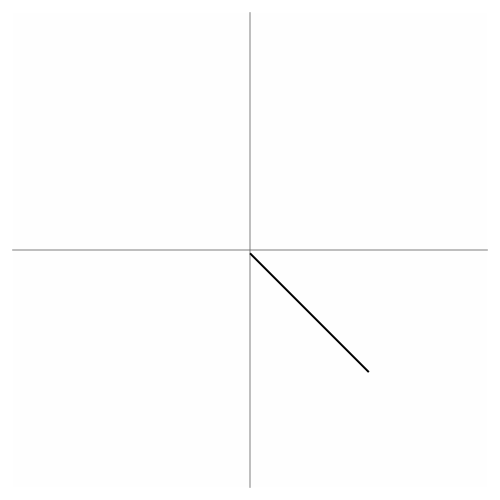

In [147]:
def translate(t):
    affine = tx.translation(V2(0, t / T))
    return line.apply_transform(affine)

animate_jax(translate)


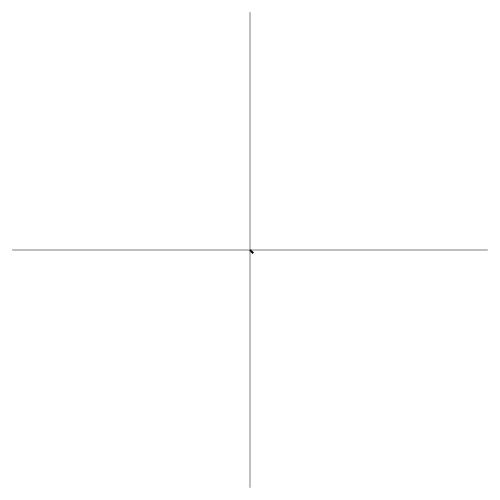

In [38]:
def scale(t):
    affine = tx.scale(t / T)
    return line.apply_transform(affine)

animate(scale)


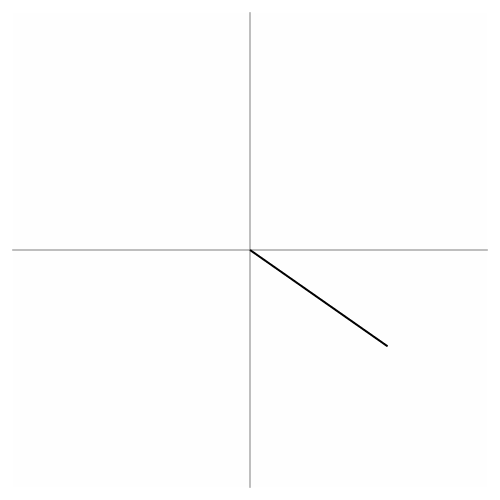

In [6]:
def rotate(t):
    affine = tx.rotation((t/ T) * 2 * np.pi)
    return line.apply_transform(affine)
animate(rotate)


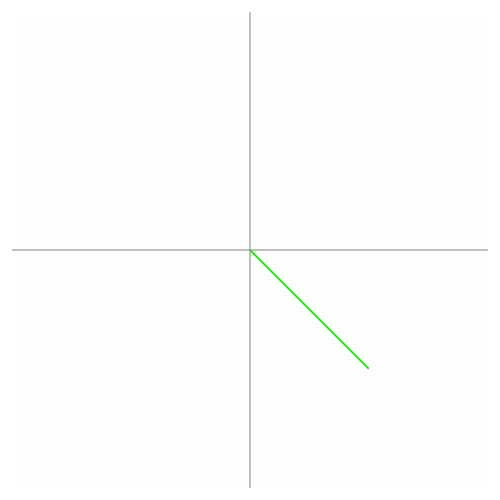

In [7]:
def color_line(t):
    r = np.array([t / T, 0, 0])
    g = np.array([0, (T -t)/ T, 0])
    return line.line_color(r + g)
animate(color_line)


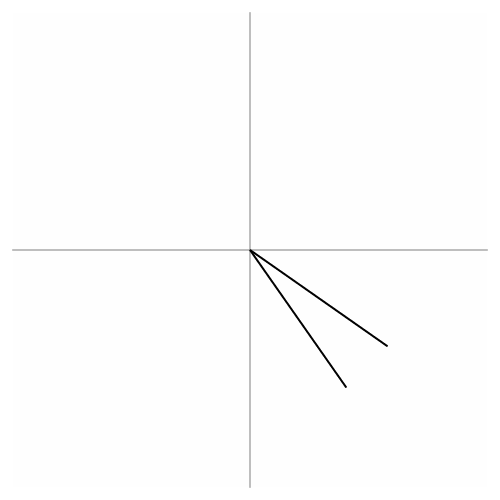

In [8]:
def cat(t):
    affine = tx.rotation((t/ T) * 2 * np.pi)
    affine2 = tx.inv(affine)
    return line.apply_transform(affine) + line.apply_transform(affine2)


animate(cat)


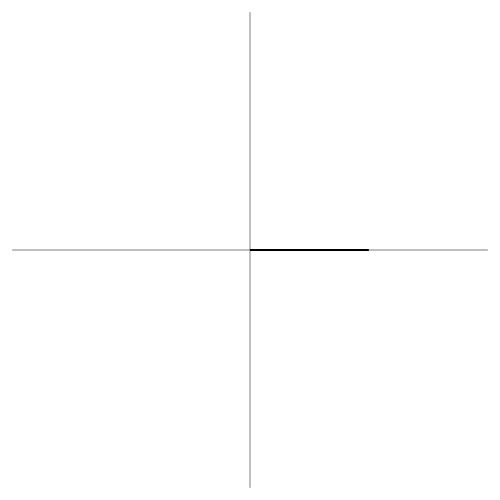

In [9]:
def arc(t):
    v = V2(1, 0)
    return arc_seg(v, t / T).stroke()
    
    
animate(arc)


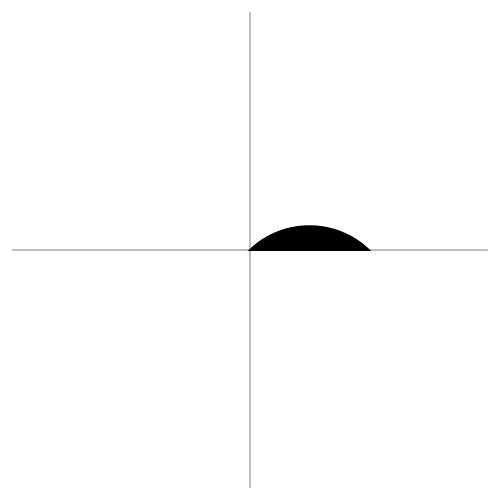

In [10]:
def closed(t):
    v = V2(1, 0)
    return (arc_seg(v, t/ T) + arc_seg(-v, -0.2) ).close().stroke()
    
animate(closed)


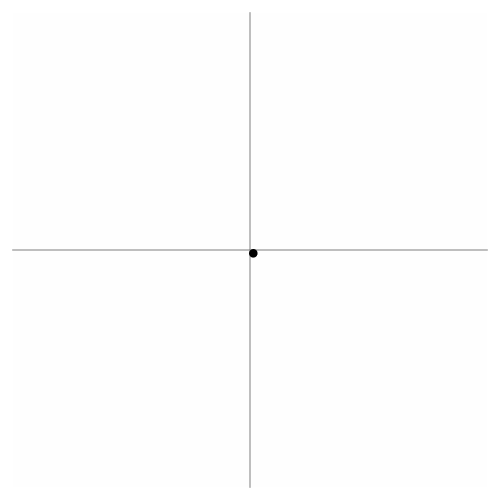

In [11]:
    
def circle_at(p, s):
    circle = (arc_seg(V2(0, 2), 1) + arc_seg(V2(0, -2), 1)).close().stroke()
    return circle.apply_transform(tx.translation(p) @ tx.scale(s) @ tx.translation(V2(0, -1)))

def circle(t):
    return circle_at(t/T, t/T)
animate(circle)


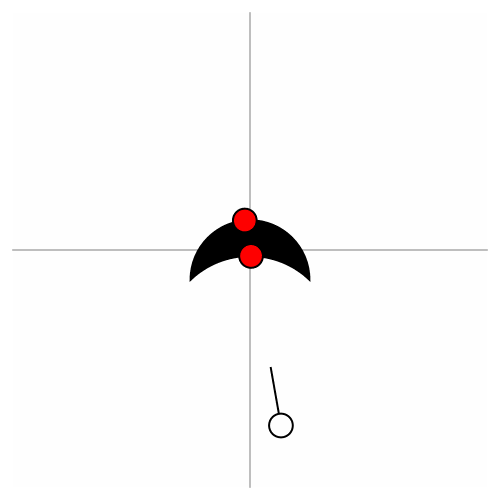

In [12]:
from functools import partial

part1 = arc_seg(unit_x, 0.5)
part2 = arc_seg(-unit_x, -0.2)
d = (part1 + part2).close().stroke()
def trace(d, t, px=0, py=0):
    d = d.center_xy()
    # Outer satelite
    affine = tx.rotation((t/ T) * 2 * np.pi)
    pt, v = P2(0, 1.5),  V2(0, -1.5)
    pt, v = affine @ pt + V2(px, py), affine @ v

    # Trace the image
    trace = d.get_trace()
    p, m = trace(pt, v)
    
    # print.
    line = seg(V2(0, -1/2)).stroke()
    out = d + line.apply_transform(tx.translation(pt) @ affine) + circle_at(pt, 0.1).fill_color("white") 
    for i in range(p.shape[1]):
        if m[:, i]:
            out = out + circle_at(p[:, i] * v + pt, 0.1).fill_color("red")
    return out
animate(partial(trace, d))

How does this work?


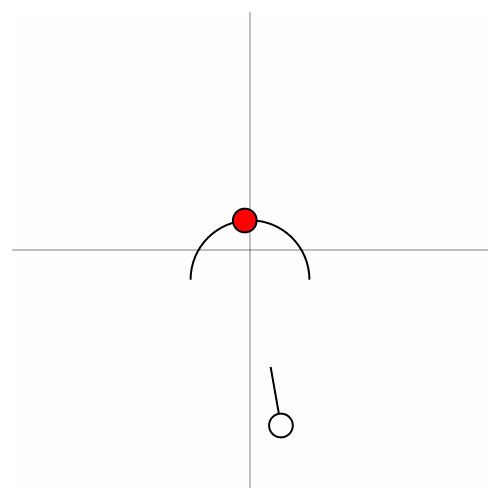

In [13]:
animate(partial(trace, part1.stroke()))


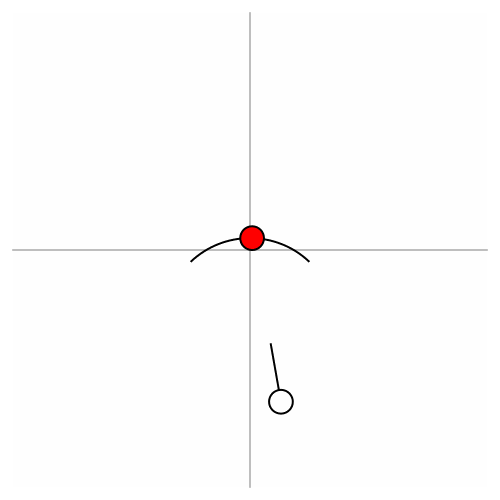

In [14]:
animate(partial(trace, part2.stroke(), py=-0.2))

Overlap at the origin

In [263]:

def opt(x, fn, steps=100):
    res = []
    fn = jax.jit(jax.value_and_grad(fn, has_aux=True))
    solver = optax.adam(learning_rate=0.3)
    opt_state = solver.init(x)
    loss = []
    for j in range(steps):
        chalk.transform.set_jax_mode(True)
        value, grad = fn(x)
        score, out = value
        loss.append(score)
        out, h, w = out
        updates, opt_state = solver.update(grad, opt_state, x)
        x = optax.apply_updates(x, updates)
        out = jax.tree.map(onp.asarray, out)
        chalk.transform.set_jax_mode(False)
        #chalk.backend.svg.prims_to_file(out, f"test.{j:03d}.svg", h, w)
        chalk.backend.cairo.prims_to_file(out, f"/tmp/test.{j:03d}.png", h, w)
        chalk.transform.set_jax_mode(True)
    plt.plot(loss)
    images= sorted(glob.glob("/tmp/test.*.png"))
    return animate_out(images)

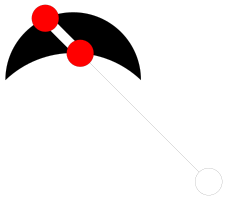

In [266]:
def render_trace(d, pt, v):
    # Trace the image
    trace = d.get_trace()
    p, m = trace(pt, v)
    
    line = seg(V2(0, -1/2)).stroke()
    out = d +  seg(v).stroke().translate_by(pt) + circle_at(pt, 0.1).fill_color("white")
    score = p[:, 1] - p[:, 0] 
    pos = (1-m[:, :])[..., None, None] * 100 + p[..., None, None] * v + pt

    out = out + Path.from_points([pos[:, 0], pos[:, 1] + eps]).stroke().line_color("white").line_width(10)
    for i in range(2):
        out = out + circle_at(pos[:, i], 0.1).fill_color("red")
    return out, p
render_trace(d.center_xy(), P2(1, 1), V2(-1, -1))[0]


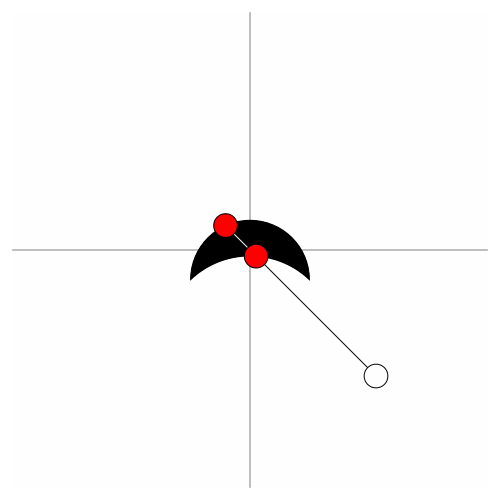

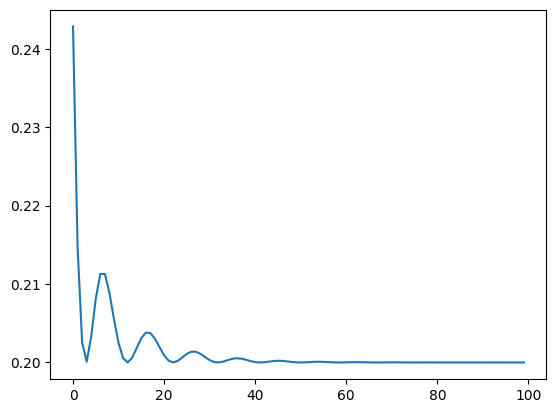

In [258]:
def trace(d, t, px=0, py=0):
    d = d.center_xy()
    # Outer satelite
    affine = tx.rotation(t)
    pt, v = P2(0, 1.5),  V2(0, -1.5)
    pt, v = affine @ pt + V2(px, py), affine @ v

    # Trace the image
    out, p = render_trace(d, pt, v)
    score = p[:, 1] - p[:, 0]
    return score.sum(), chalk.core.layout_primitives(grid + out.line_width(1), 500)


chalk.transform.set_jax_mode(True)
opt(np.array(np.pi / 4.), partial(trace, d))

Path(loc_trails=[Located(trail=Trail(segments=Segment(transform=Array([[[[ 1.0000000e+00,  0.0000000e+00,  6.1232340e-17],
         [ 0.0000000e+00,  1.0000000e+00,  1.0000000e+00],
         [ 0.0000000e+00,  0.0000000e+00,  1.0000000e+00]],

        [[-1.0000000e+00,  1.2246468e-16,  6.1232340e-17],
         [-1.2246468e-16, -1.0000000e+00, -1.0000000e+00],
         [ 0.0000000e+00,  0.0000000e+00,  1.0000000e+00]]],


       [[[ 1.0000000e+00,  0.0000000e+00,  6.1232340e-17],
         [ 0.0000000e+00,  1.0000000e+00,  1.0000000e+00],
         [ 0.0000000e+00,  0.0000000e+00,  1.0000000e+00]],

        [[-1.0000000e+00,  1.2246468e-16,  6.1232340e-17],
         [-1.2246468e-16, -1.0000000e+00, -1.0000000e+00],
         [ 0.0000000e+00,  0.0000000e+00,  1.0000000e+00]]],


       [[[ 1.0000000e+00,  0.0000000e+00,  6.1232340e-17],
         [ 0.0000000e+00,  1.0000000e+00,  1.0000000e+00],
         [ 0.0000000e+00,  0.0000000e+00,  1.0000000e+00]],

        [[-1.0000000e+00,  1.2246468e

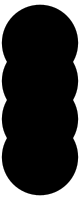

In [131]:
chalk.transform.set_jax_mode(True)

def draw(i):
    return circle_at(P2(0, i), 1.0)
jax.vmap(draw)(np.arange(1, 5))

Path(loc_trails=[Located(trail=Trail(segments=Segment(transform=Array([[[[ 1.0000000e+00,  0.0000000e+00,  6.1232340e-17],
         [ 0.0000000e+00,  1.0000000e+00,  1.0000000e+00],
         [ 0.0000000e+00,  0.0000000e+00,  1.0000000e+00]],

        [[-1.0000000e+00,  1.2246468e-16,  6.1232340e-17],
         [-1.2246468e-16, -1.0000000e+00, -1.0000000e+00],
         [ 0.0000000e+00,  0.0000000e+00,  1.0000000e+00]]],


       [[[ 1.0000000e+00,  0.0000000e+00,  6.1232340e-17],
         [ 0.0000000e+00,  1.0000000e+00,  1.0000000e+00],
         [ 0.0000000e+00,  0.0000000e+00,  1.0000000e+00]],

        [[-1.0000000e+00,  1.2246468e-16,  6.1232340e-17],
         [-1.2246468e-16, -1.0000000e+00, -1.0000000e+00],
         [ 0.0000000e+00,  0.0000000e+00,  1.0000000e+00]]],


       [[[ 1.0000000e+00,  0.0000000e+00,  6.1232340e-17],
         [ 0.0000000e+00,  1.0000000e+00,  1.0000000e+00],
         [ 0.0000000e+00,  0.0000000e+00,  1.0000000e+00]],

        [[-1.0000000e+00,  1.2246468e

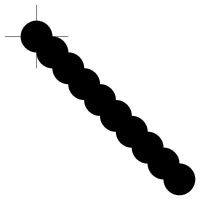

In [140]:
def draw(i):
    x, y = i // 4, i % 4
    return circle_at(i, 1)
grid  + jax.vmap(draw)(np.arange(10))



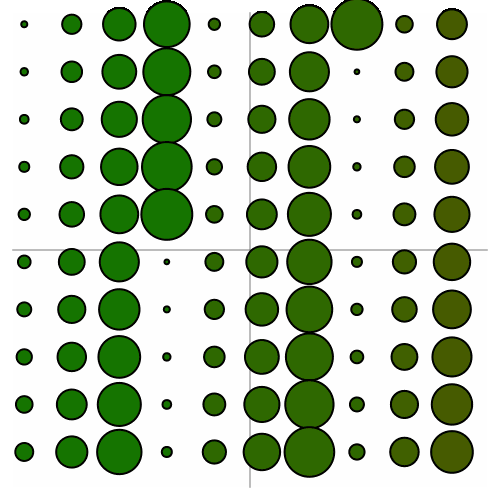

In [192]:
chalk.transform.set_jax_mode(True)

r = chalk.style.to_color("red")
g = chalk.style.to_color("green")

def multi(t):
    def draw(i):
        x, y = i // 10, i % 10
        c = lambda i: ((t + i) % T /T)
        return circle_at(P2(4 *x / 10, 4*y/10) - P2(1.9, 1.9), 2 * c(i) / 10 + 0.02).fill_color(c(x) * r + (1 - c(x))*g)
    return jax.vmap(draw)(np.arange(100))

animate(jax.jit(multi))


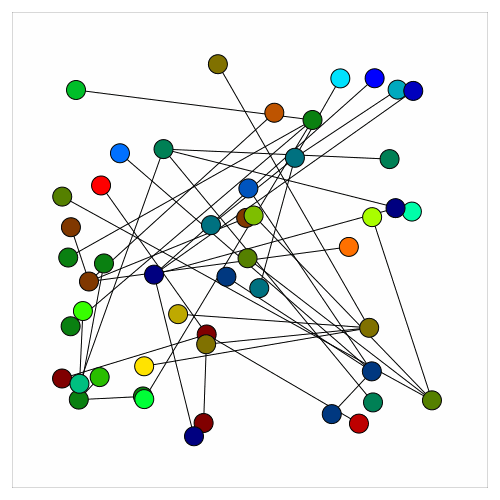

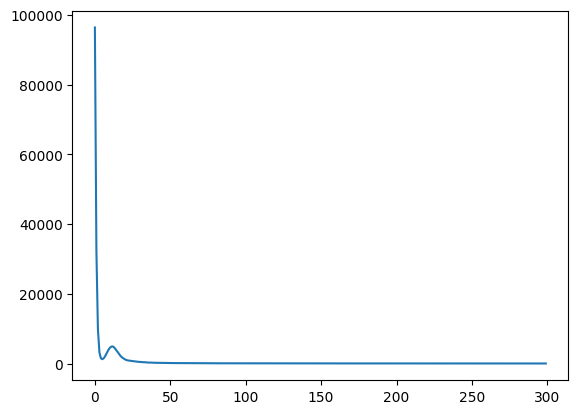

In [194]:

size = 50
around = 5
color = np.stack([chalk.style.to_color(c) 
                  for c in  Color("red").range_to("blue", size // around)],
                 axis=0)

matrix = jax.random.uniform(jax.random.PRNGKey(0), (size, 2)) * 4 - 2
edges = np.stack([np.minimum(size, np.ones((size,), int) + around * (np.arange(size) // around)) 
                  ], axis=1)

@jax.jit
def graph(x):
    # Draw nodes
    def dots(p, i):
        d = circle(0.1).translate(p[0], p[1]).fill_color(color[i // around] * np.maximum((i % around) / (around - 1), 0.5))
        return d
    out = jax.vmap(dots)(x, np.arange(size)).with_envelope(empty()).line_width(1)    

    # draw edges
    def connect(p):
        eps = 1e-4
        return make_path([(p[0, 0], p[0, 1]), 
                        (p[1, 0]+ eps, p[1, 1] + eps)])
        
    a, b = x[:, None, :].repeat(connects, axis=1), x[edges]
    v = np.stack([a, b], axis=-2).reshape((-1, 2, 2))
    lines = jax.vmap(connect)(v).with_envelope(empty())

    # Loss function 
    center =  1/10 * np.abs(x).sum()
    repulse = (1/ size) * ((1 / (1e-3 + np.pow(x[:, None, :] - x, 2).sum(-1))) * (1 -np.eye(size))).sum()
    spring = size * np.pow(np.pow(v[:, 1] - v[:, 0], 2).sum(-1) - 0.04, 2).sum()
    score = spring + center + repulse
    
    
    out = lines.line_width(1) + out
    out = rectangle(5, 5).fill_color("white")  + out
    return score, chalk.core.layout_primitives(out, 500)

opt(matrix, graph, steps=300)


# Rendering


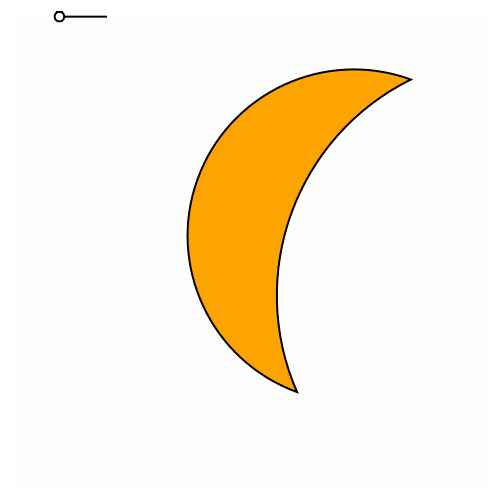

In [389]:
shape = d.scale(7).rotate(70).translate(6, 8).fill_color("orange")
def scan(t):
    return render_trace(shape, P2(1, 10 * t/ 100), V2(1, 0))[0]

animate(scan, grid=hgrid, steps = 100)

In [296]:
shape.get_trace()(P2(0, 5), V2(1, 0))

(array([[ 3.7090162 ,  5.66861378, 10.6851248 , 15.63226799]]),
 array([[1, 1, 0, 0]]))


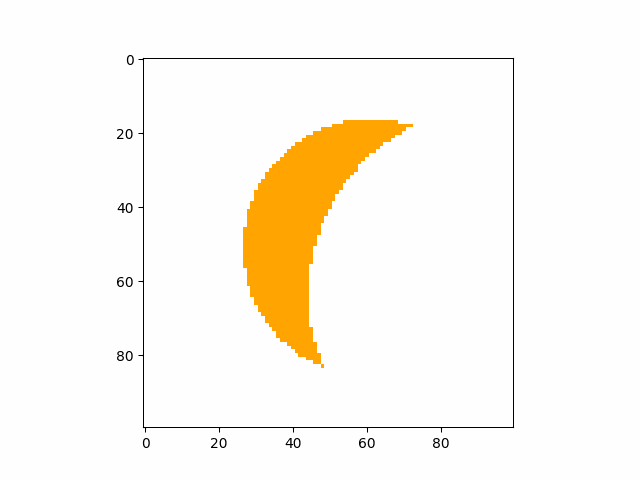

<Figure size 640x480 with 0 Axes>

In [392]:
@partial(jax.jit, static_argnums=(2,3))
def render_line(splits, mask, l, f=1):
    splits, oob = splits * f, (1 - mask) * 1000
    scene = np.zeros(l)
    split_int = np.floor(splits).astype(int)
    loc = np.arange(splits.shape[-1]) % 2
    inout = np.where(loc, -1, 1)
    scene = scene.at[split_int + oob].add(inout)
    scene = np.cumsum(scene)
    return scene.at[split_int + oob].set(np.where(loc, 0, -1) + inout * (splits - split_int))

def render_shape(s):
    raster = jax.vmap(lambda i: render_line(*s.get_trace()(P2(0, i), V2(1, 0)), 100, 10))(np.arange(100)/ 10)
    return 1.0 -(raster[..., None] * (1 - s.style.fill_color_))
    
os.system("rm /tmp/test*.png")
chalk.transform.set_jax_mode(True)
def im(t):
    s = shape.center_xy().rotate_by(t / T).translate(5, 5)
    img = render_shape(s)
    img = np.minimum(1.0, img)
    plt.imshow(img)
    plt.savefig(f"/tmp/test.{t:02d}.png")
    plt.clf()
for i in range(T):
    im(i)
animate_out(sorted(glob.glob("/tmp/test.*.png")))


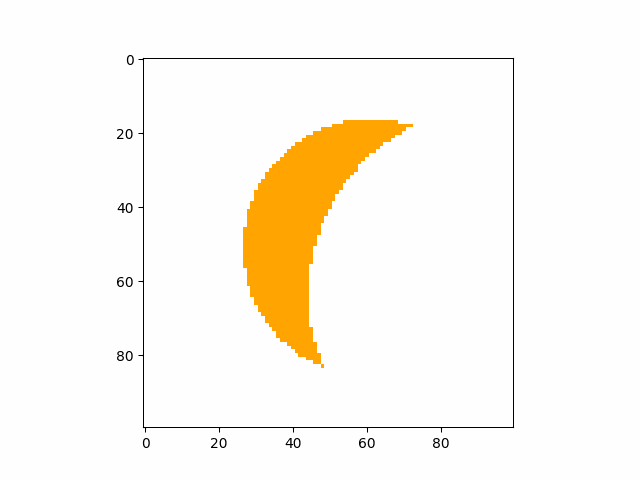

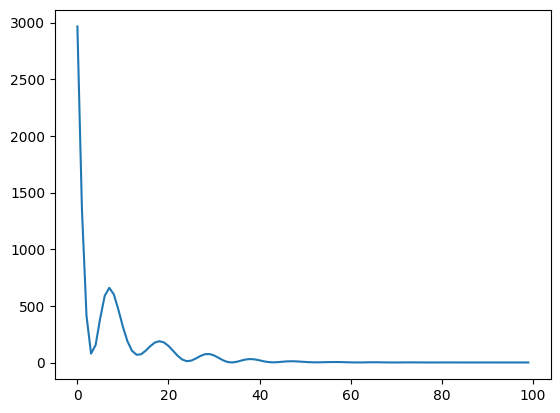

In [402]:
goal = render_shape(shape)

def make_shape(color):
    return shape.fill_color(color)

def loss(x):
    y = render_shape(x)
    return np.pow(y - goal, 2).sum(), chalk.core.layout_primitives(x, 500)

opt(chalk.style.to_color("blue"), lambda x: loss(make_shape(x)))

In [17]:
aff = tx.translation(V2(2, 3))
(aff @ z).show_origin()

NameError: name 'z' is not defined

In [ ]:
concat([tx.translation(V2(2* i, 3)) @ z for i in range(3)])

In [ ]:
t = seg(V2(1,0)) + seg(V2(2, 3))
t.stroke().show_origin()

In [ ]:
t = seg(V2(1,0)) + seg(V2(1, 1)) + seg(V2(-1, 0)) + seg(V2(-1, -1))
t.close().stroke()

In [ ]:
t = arc_seg(V2(1,0), 0.5).stroke()
t

In [ ]:
turn = tx.rotation(np.pi)
x = arc_seg(V2(1,0), 0.5)

circle = (x + (turn @ x)).close().stroke()

circle = (tx.translation(V2(-0.5, 0)) @ circle)
circle.show_origin()

In [ ]:
t = [arc_seg(V2(1,0), i / 5).stroke() for i in range(1, 5)] 
concat(t)

In [ ]:
p = P2(4, 5)
p

In [ ]:
def line(p1, p2):
    return tx.translation(p1) @ seg(p2 - p1).stroke()
line(P2(2, 2), P2(4, 5)).show_origin()

In [ ]:
def draw_point(p):
    return tx.translation(p) @ circle.fill_color("red")
draw_point(p).show_origin()

In [ ]:
big_circle = tx.scale(V2(5, 5)) @ circle
trace = big_circle.get_trace()
v = V2(-4, -5)
p2, m2 = trace(p, v)
big_circle + draw_point(p) + concat([draw_point(i * v+ p).fill_color("blue")
                                 for i, j in zip(p2[0], m2[0]) if j])


In [ ]:
type(circle)

In [ ]:
p_many = P2(np.arange(5), np.array([5] * 5))
draw_point(p_many).show_origin()

In [ ]:
p_many = P2(np.arange(5), np.array(5))
v_many = tx.to_vec(p_many)
p2, m2 = trace(p_many, -v_many)
colors = list(Color("blue").range_to("red", 5))
big_circle + \
    concat([(draw_point(p_many[k]) + draw_point(i * -v_many[k] + p_many[k])).fill_color(colors[k])
            for k in range(p2.shape[0])
            for i, j in zip(p2[k], m2[k]) 
            if j])